In [2]:
import numpy as np   
import pandas as pd    
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn import metrics
import matplotlib.pyplot as plt   
import matplotlib.style

In [3]:
# reading the CSV file into pandas dataframe
df = pd.read_excel("compactiv.xlsx") 

# EDA

In [4]:
# Check top few records to get a feel of the data structure
df.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
0,1,0,2147,79,68,0.2,0.2,40671.0,53995.0,0.0,...,0.0,0.0,1.6,2.6,16.00,26.40,CPU_Bound,4670,1730946,95
1,0,0,170,18,21,0.2,0.2,448.0,8385.0,0.0,...,0.0,0.0,0.0,0.0,15.63,16.83,Not_CPU_Bound,7278,1869002,97
2,15,3,2162,159,119,2.0,2.4,NaN,31950.0,0.0,...,0.0,1.2,6.0,9.4,150.20,220.20,Not_CPU_Bound,702,1021237,87
3,0,0,160,12,16,0.2,0.2,NaN,8670.0,0.0,...,0.0,0.0,0.2,0.2,15.60,16.80,Not_CPU_Bound,7248,1863704,98
4,5,1,330,39,38,0.4,0.4,NaN,12185.0,0.0,...,0.0,0.0,1.0,1.2,37.80,47.60,Not_CPU_Bound,633,1760253,90


In [6]:
df.shape

(8192, 22)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8192 entries, 0 to 8191
Data columns (total 22 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   lread     8192 non-null   int64  
 1   lwrite    8192 non-null   int64  
 2   scall     8192 non-null   int64  
 3   sread     8192 non-null   int64  
 4   swrite    8192 non-null   int64  
 5   fork      8192 non-null   float64
 6   exec      8192 non-null   float64
 7   rchar     8088 non-null   float64
 8   wchar     8177 non-null   float64
 9   pgout     8192 non-null   float64
 10  ppgout    8192 non-null   float64
 11  pgfree    8192 non-null   float64
 12  pgscan    8192 non-null   float64
 13  atch      8192 non-null   float64
 14  pgin      8192 non-null   float64
 15  ppgin     8192 non-null   float64
 16  pflt      8192 non-null   float64
 17  vflt      8192 non-null   float64
 18  runqsz    8192 non-null   object 
 19  freemem   8192 non-null   int64  
 20  freeswap  8192 non-null   int6

# 5 point summary and all

In [5]:
df.describe(include="all")

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
count,8192.000000,8192.000000,8192.000000,8192.000000,8192.000000,8192.000000,8192.000000,8.088000e+03,8.177000e+03,8192.000000,...,8192.000000,8192.000000,8192.000000,8192.000000,8192.000000,8192.000000,8192,8192.000000,8.192000e+03,8192.000000
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,2,NaN,NaN,NaN
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,Not_CPU_Bound,NaN,NaN,NaN
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,4331,NaN,NaN,NaN
mean,19.559692,13.106201,2306.318237,210.479980,150.058228,1.884554,2.791998,1.973857e+05,9.590299e+04,2.285317,...,21.526849,1.127505,8.277960,12.388586,109.793799,185.315796,NaN,1763.456299,1.328126e+06,83.968872
std,53.353799,29.891726,1633.617322,198.980146,160.478980,2.479493,5.212456,2.398375e+05,1.408417e+05,5.307038,...,71.141340,5.708347,13.874978,22.281318,114.419221,191.000603,NaN,2482.104511,4.220194e+05,18.401905
min,0.000000,0.000000,109.000000,6.000000,7.000000,0.000000,0.000000,2.780000e+02,1.498000e+03,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.200000,NaN,55.000000,2.000000e+00,0.000000
25%,2.000000,0.000000,1012.000000,86.000000,63.000000,0.400000,0.200000,3.409150e+04,2.291600e+04,0.000000,...,0.000000,0.000000,0.600000,0.600000,25.000000,45.400000,NaN,231.000000,1.042624e+06,81.000000
50%,7.000000,1.000000,2051.500000,166.000000,117.000000,0.800000,1.200000,1.254735e+05,4.661900e+04,0.000000,...,0.000000,0.000000,2.800000,3.800000,63.800000,120.400000,NaN,579.000000,1.289290e+06,89.000000
75%,20.000000,10.000000,3317.250000,279.000000,185.000000,2.200000,2.800000,2.678288e+05,1.061010e+05,2.400000,...,0.000000,0.600000,9.765000,13.800000,159.600000,251.800000,NaN,2002.250000,1.730380e+06,94.000000


In [7]:
# Are there any missing values ?
df.isnull().sum()

lread         0
lwrite        0
scall         0
sread         0
swrite        0
fork          0
exec          0
rchar       104
wchar        15
pgout         0
ppgout        0
pgfree        0
pgscan        0
atch          0
pgin          0
ppgin         0
pflt          0
vflt          0
runqsz        0
freemem       0
freeswap      0
usr           0
dtype: int64

In [8]:
for column in df.columns:
    if df[column].dtype != 'object':
        mean = df[column].mean()
        df[column] = df[column].fillna(mean)    
        
df.isnull().sum()

lread       0
lwrite      0
scall       0
sread       0
swrite      0
fork        0
exec        0
rchar       0
wchar       0
pgout       0
ppgout      0
pgfree      0
pgscan      0
atch        0
pgin        0
ppgin       0
pflt        0
vflt        0
runqsz      0
freemem     0
freeswap    0
usr         0
dtype: int64

In [9]:
df.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
0,1,0,2147,79,68,0.2,0.2,40671.000000,53995.0,0.0,...,0.0,0.0,1.6,2.6,16.00,26.40,CPU_Bound,4670,1730946,95
1,0,0,170,18,21,0.2,0.2,448.000000,8385.0,0.0,...,0.0,0.0,0.0,0.0,15.63,16.83,Not_CPU_Bound,7278,1869002,97
2,15,3,2162,159,119,2.0,2.4,197385.728363,31950.0,0.0,...,0.0,1.2,6.0,9.4,150.20,220.20,Not_CPU_Bound,702,1021237,87
3,0,0,160,12,16,0.2,0.2,197385.728363,8670.0,0.0,...,0.0,0.0,0.2,0.2,15.60,16.80,Not_CPU_Bound,7248,1863704,98
4,5,1,330,39,38,0.4,0.4,197385.728363,12185.0,0.0,...,0.0,0.0,1.0,1.2,37.80,47.60,Not_CPU_Bound,633,1760253,90


In [10]:
df.describe()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgfree,pgscan,atch,pgin,ppgin,pflt,vflt,freemem,freeswap,usr
count,8192.000000,8192.000000,8192.000000,8192.000000,8192.000000,8192.000000,8192.000000,8.192000e+03,8.192000e+03,8192.000000,...,8192.000000,8192.000000,8192.000000,8192.000000,8192.000000,8192.000000,8192.000000,8192.000000,8.192000e+03,8192.000000
mean,19.559692,13.106201,2306.318237,210.479980,150.058228,1.884554,2.791998,1.973857e+05,9.590299e+04,2.285317,...,11.919712,21.526849,1.127505,8.277960,12.388586,109.793799,185.315796,1763.456299,1.328126e+06,83.968872
std,53.353799,29.891726,1633.617322,198.980146,160.478980,2.479493,5.212456,2.383100e+05,1.407127e+05,5.307038,...,32.363520,71.141340,5.708347,13.874978,22.281318,114.419221,191.000603,2482.104511,4.220194e+05,18.401905
min,0.000000,0.000000,109.000000,6.000000,7.000000,0.000000,0.000000,2.780000e+02,1.498000e+03,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.200000,55.000000,2.000000e+00,0.000000
25%,2.000000,0.000000,1012.000000,86.000000,63.000000,0.400000,0.200000,3.486050e+04,2.297775e+04,0.000000,...,0.000000,0.000000,0.000000,0.600000,0.600000,25.000000,45.400000,231.000000,1.042624e+06,81.000000
50%,7.000000,1.000000,2051.500000,166.000000,117.000000,0.800000,1.200000,1.278250e+05,4.665300e+04,0.000000,...,0.000000,0.000000,0.000000,2.800000,3.800000,63.800000,120.400000,579.000000,1.289290e+06,89.000000
75%,20.000000,10.000000,3317.250000,279.000000,185.000000,2.200000,2.800000,2.653948e+05,1.060370e+05,2.400000,...,5.000000,0.000000,0.600000,9.765000,13.800000,159.600000,251.800000,2002.250000,1.730380e+06,94.000000
max,1845.000000,575.000000,12493.000000,5318.000000,5456.000000,20.120000,59.560000,2.526649e+06,1.801623e+06,81.440000,...,523.000000,1237.000000,211.580000,141.200000,292.610000,899.800000,1365.000000,12027.000000,2.243187e+06,99.000000


In [11]:
# Are there any duplicates ?
dups = df.duplicated()
print('Number of duplicate rows = %d' % (dups.sum()))
#df[dups]

Number of duplicate rows = 0


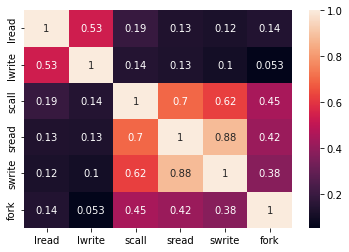

In [12]:
sns.heatmap(df.iloc[:, 0:6].corr(),annot=True)
plt.show()

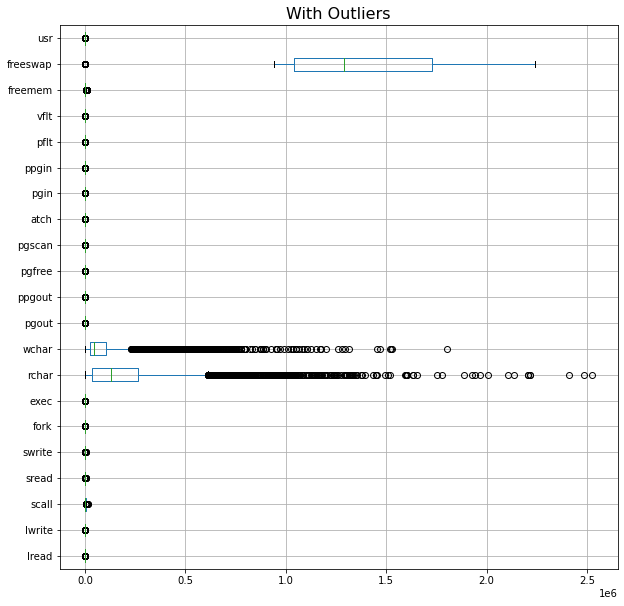

In [13]:
# construct box plot for continuous variables
cont=df.dtypes[(df.dtypes!='uint8') & (df.dtypes!='bool')].index
plt.figure(figsize=(10,10))
df[cont].boxplot(vert=0)
plt.title('With Outliers',fontsize=16)
plt.show()

We will remove the outliers as it will impact the dataset significantly.

In [16]:
def remove_outlier(col):
    sorted(col)
    Q1,Q3=np.percentile(col,[25,75])
    IQR=Q3-Q1
    lower_range= Q1-(1.5 * IQR)
    upper_range= Q3+(1.5 * IQR)
    return lower_range, upper_range

In [17]:
for column in df[cont].columns:
    lr,ur=remove_outlier(df[column])
    df[column]=np.where(df[column]>ur,ur,df[column])
    df[column]=np.where(df[column]<lr,lr,df[column])

TypeError: unsupported operand type(s) for -: 'str' and 'str'

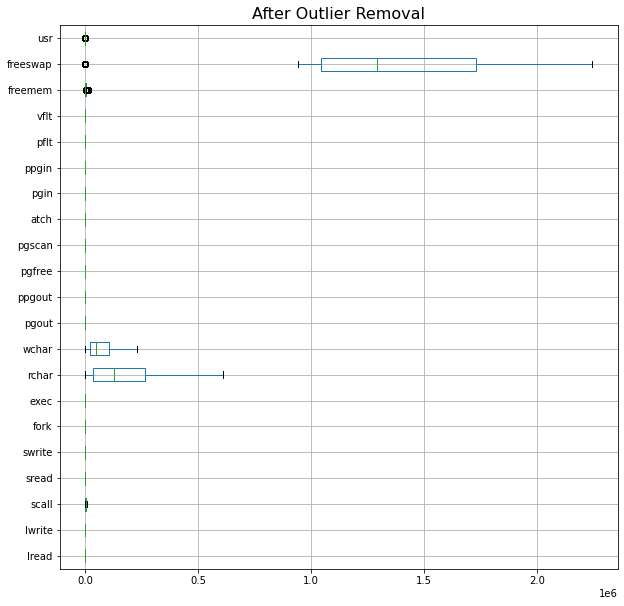

In [18]:
plt.figure(figsize=(10,10))
df[cont].boxplot(vert=0)
plt.title('After Outlier Removal',fontsize=16)
plt.show()

# Univariant Analysis

C:\Users\anand.rj\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


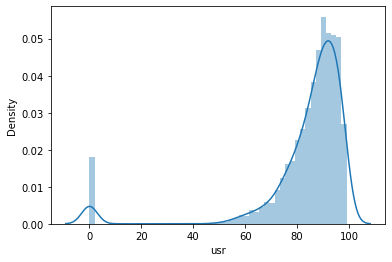

In [9]:
sns.distplot(df['usr'])
plt.show()

# Bivariate analysis

C:\Users\anand.rj\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


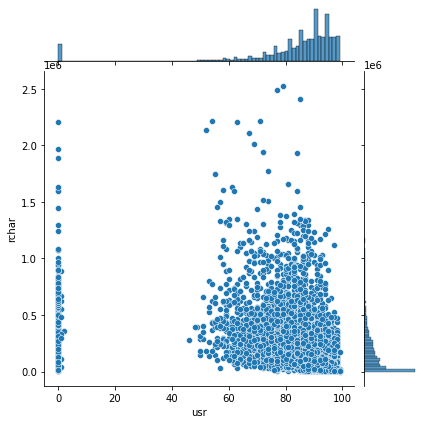

In [10]:
sns.jointplot(df['usr'], df['rchar']) ### annotate function of stats is to print correlation value

# Mutivariate analysis

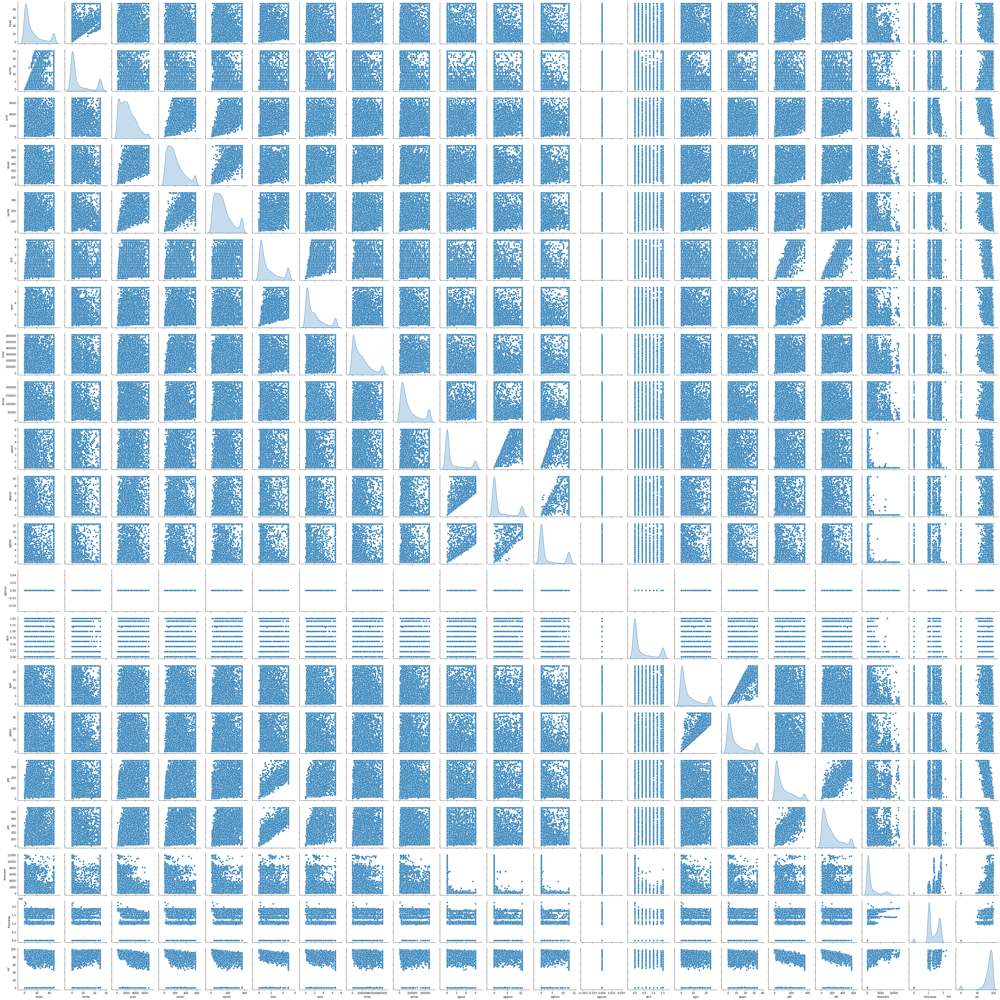

In [19]:
df_attr = (df[cont])
sns.pairplot(df_attr, diag_kind='kde')  
plt.show()

In [24]:
df['runqsz']=np.where(df['runqsz'] =='CPU_Bound', 1, df['runqsz'])
df['runqsz']=np.where(df['runqsz'] =='Not_CPU_Bound', 0, df['runqsz'])

# Train-Test Split

In [25]:
# Copy all the predictor variables into X dataframe
X = df.drop('usr', axis=1)

# Copy target into the y dataframe. 
y = df[['usr']]

In [26]:
X.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgfree,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap
0,1.0,0.0,2147.0,79.0,68.0,0.2,0.2,40671.000000,53995.0,0.0,...,0.0,0.0,0.0,1.6,2.6,16.00,26.40,1,4670,1730946
1,0.0,0.0,170.0,18.0,21.0,0.2,0.2,448.000000,8385.0,0.0,...,0.0,0.0,0.0,0.0,0.0,15.63,16.83,0,7278,1869002
2,15.0,3.0,2162.0,159.0,119.0,2.0,2.4,197385.728363,31950.0,0.0,...,0.0,0.0,1.2,6.0,9.4,150.20,220.20,0,702,1021237
3,0.0,0.0,160.0,12.0,16.0,0.2,0.2,197385.728363,8670.0,0.0,...,0.0,0.0,0.0,0.2,0.2,15.60,16.80,0,7248,1863704
4,5.0,1.0,330.0,39.0,38.0,0.4,0.4,197385.728363,12185.0,0.0,...,0.0,0.0,0.0,1.0,1.2,37.80,47.60,0,633,1760253


In [47]:
# Split X and y into training and test set in 70:30 ratio
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30 , random_state=1)

# Linear Regression Model

In [48]:
# invoke the LinearRegression function and find the bestfit model on training data

regression_model = LinearRegression()
regression_model.fit(X_train, y_train)

LinearRegression()

In [49]:
# Let us explore the coefficients for each of the independent attributes

for idx, col_name in enumerate(X_train.columns):
    print("The coefficient for {} is {}".format(col_name, regression_model.coef_[0][idx]))

The coefficient for lread is -0.0794828082880799
The coefficient for lwrite is 0.045900210165122614
The coefficient for scall is 0.0010357089310742752
The coefficient for sread is 0.0010244395067665296
The coefficient for swrite is -0.005455510506131745
The coefficient for fork is -0.9067038084214188
The coefficient for exec is -0.07753162207039793
The coefficient for rchar is -1.0412101593352645e-05
The coefficient for wchar is -8.346699232727327e-06
The coefficient for pgout is -0.6526139735044538
The coefficient for ppgout is -0.03849556909629245
The coefficient for pgfree is 0.14517951657963962
The coefficient for pgscan is 0.0
The coefficient for atch is 1.188106111320322
The coefficient for pgin is 0.2978850734753064
The coefficient for ppgin is -0.17299744198934724
The coefficient for pflt is -0.05297346386696489
The coefficient for vflt is 0.015011393299821868
The coefficient for runqsz is -7.282096436065254
The coefficient for freemem is -0.0015741478343500469
The coefficient 

In [50]:
# Let us check the intercept for the model

intercept = regression_model.intercept_[0]

print("The intercept for our model is {}".format(intercept))

The intercept for our model is 52.67731844396813


In [51]:
# R square on training data
regression_model.score(X_train, y_train)

0.62592386042391

In [52]:
# R square on testing data
regression_model.score(X_test, y_test)

0.6177692493269991

In [53]:
#RMSE on Training data
predicted_train=regression_model.fit(X_train, y_train).predict(X_train)
np.sqrt(metrics.mean_squared_error(y_train,predicted_train))

11.066318530520695

In [54]:
#RMSE on Testing data
predicted_test=regression_model.fit(X_train, y_train).predict(X_test)
np.sqrt(metrics.mean_squared_error(y_test,predicted_test))

11.803511965603906

# Linear Regression using statsmodels(OLS)

In [55]:
import statsmodels.api as sm

In [56]:
X_train=sm.add_constant(X_train)# This adds the constant term beta0 to the Simple Linear Regression.
X_test=sm.add_constant(X_test)

In [57]:
model = sm.OLS(y_train.astype(float),X_train.astype(float)).fit()
model

In [58]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    usr   R-squared:                       0.626
Model:                            OLS   Adj. R-squared:                  0.625
Method:                 Least Squares   F-statistic:                     478.0
Date:                Sun, 08 Jan 2023   Prob (F-statistic):               0.00
Time:                        23:04:09   Log-Likelihood:                -21920.
No. Observations:                5734   AIC:                         4.388e+04
Df Residuals:                    5713   BIC:                         4.402e+04
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         52.6773      0.740     71.226      0.000      51.227      54.127
lread         -0.0795      0.022     -3.535      0.000      -0.124      -0.035
lwrite         0.0459      0.033      1.397      0.162      -0.019       0.110
scall          0.0010      0.000      6.577      0.000       0.001       0.001
sread          0.0010      0.003      0.406      0.685      -0.004       0.006
swrite        -0.0055      0.004     -1.519      0.129      -0.012       0.002
fork          -0.9067      0.330     -2.747      0.006      -1.554      -0.260
exec          -0.0775      0.129     -0.599      0.549      -0.331       0.176
rchar      -1.041e-05   1.22e-06     -8.534      0.000   -1.28e-05   -8.02e-06
wchar      -8.347e-06   2.58e-06     -3.233      0.001   -1.34e-05   -3.28e-06
pgout         -0.6526      0.225     -2.899      0.004      -1.094      -0.211
ppgout        -0.0385      0.197     -0.195      0.845      -0.425       0.348
pgfree         0.1452      0.119      1.216      0.224      -0.089       0.379
pgscan     -2.934e-15      1e-16    -29.209      0.000   -3.13e-15   -2.74e-15
atch           1.1881      0.357      3.330      0.001       0.489       1.888
pgin           0.2979      0.071      4.183      0.000       0.158       0.437
ppgin         -0.1730      0.049     -3.504      0.000      -0.270      -0.076
pflt          -0.0530      0.005    -10.670      0.000      -0.063      -0.043
vflt           0.0150      0.004      4.203      0.000       0.008       0.022
runqsz        -7.2821      0.317    -22.975      0.000      -7.903      -6.661
freemem       -0.0016   7.92e-05    -19.886      0.000      -0.002      -0.001
freeswap    3.249e-05   4.64e-07     70.027      0.000    3.16e-05    3.34e-05
==============================================================================
Omnibus:                     1377.545   Durbin-Watson:                   2.061
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             3866.146
Skew:                          -1.262   Prob(JB):                         0.00
Kurtosis:                       6.132   Cond. No.                     1.88e+22
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 3.23e-29. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [59]:
#Calculate MSE on train
predicted_train=model.predict(X_train)
mse=metrics.mean_squared_error(y_train,predicted_train)

In [60]:
np.sqrt(mse) #RMSE on train

11.066318530520695

In [61]:
# Prediction on Test data
y_pred = model.predict(X_test)

In [62]:
#Calculate MSE on test
mse=metrics.mean_squared_error(y_test,y_pred)
np.sqrt(mse) #RMSE on test

11.803511965603182

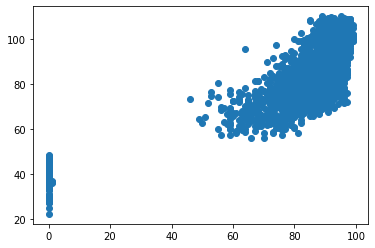

In [63]:
plt.scatter(y_test, y_pred)
plt.show()

In [64]:
for i,j in np.array(model.params.reset_index()):
    print('({}) * {} +'.format(round(j,2),i),end=' ')

(52.68) * const + (-0.08) * lread + (0.05) * lwrite + (0.0) * scall + (0.0) * sread + (-0.01) * swrite + (-0.91) * fork + (-0.08) * exec + (-0.0) * rchar + (-0.0) * wchar + (-0.65) * pgout + (-0.04) * ppgout + (0.15) * pgfree + (-0.0) * pgscan + (1.19) * atch + (0.3) * pgin + (-0.17) * ppgin + (-0.05) * pflt + (0.02) * vflt + (-7.28) * runqsz + (-0.0) * freemem + (0.0) * freeswap + 

# Conclusion

# Insights

The variable atch(Number of page attaches)(1.3868) has the major impact. The More the number of pages attached goes up the portion of the time that CPU run in user mode.

The variable pgin(Number of page-in requests per second)(0.2834) has increasing impact. The more number of the number of pages attached goes up the portion of the time that cpu run in user mode.

The variable runqsz(Process run queue size)(-7.29) has the negative impact. There is a decrease in the portion of the time that CPU run in user mode with respect to the Process run queue size.

the variable fork(Number of system fork calls per second)(-0.89)has the negative impact. There is a decrease in the portion of the time that CPU run in user mode with respect to the number of system fork calls per second.